In [1]:
import tensorflow as tf
print(tf.__version__)
!pip install --upgrade tensorflow


2.19.0


In [2]:
import opendatasets as od
import pandas as pd
import numpy as np
import pandas as pd
import os
import cv2
import matplotlib.pyplot as plt
import seaborn as sns
import PIL
from PIL import Image
import plotly
import plotly.express as px
import gc
from keras.callbacks import ModelCheckpoint,EarlyStopping

In [3]:
!pip install scikit-learn
from sklearn.model_selection import train_test_split
import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.models import Sequential
from tensorflow.keras.models import Model, load_model
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten,Input,ZeroPadding2D,BatchNormalization,Activation
from tensorflow.keras.metrics import BinaryAccuracy, Precision, Recall
from tensorflow.keras.layers import Rescaling, Resizing, RandomFlip, RandomRotation
from sklearn.metrics import classification_report
import warnings
warnings.filterwarnings("ignore")

In [4]:
#Import dataset
path = "C:\\Users\\KIIT\\Downloads\\archive\\gaussian_filtered_images\\gaussian_filtered_images"

In [5]:
No_DR_Img = os.listdir(path + '/No_DR/')
Mild_Img = os.listdir(path + '/Mild/')
Moderate_Img = os.listdir(path + '/Moderate/')
Proliferate_DR_Img = os.listdir(path + '/Proliferate_DR/')
Severe_Img = os.listdir(path + '/Severe/')

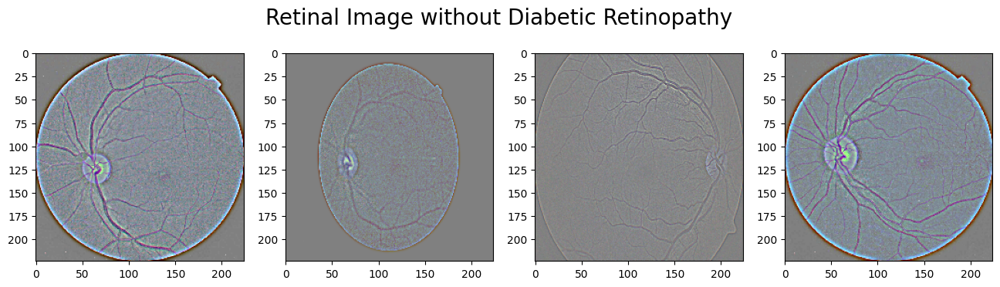

In [6]:
#Viewing the dataset
fig = plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1, 4, i+1)
    img = cv2.imread(path+'/No_DR/'+ No_DR_Img[i])
    plt.imshow(img)
plt.suptitle("Retinal Image without Diabetic Retinopathy",fontsize=20)
plt.show()

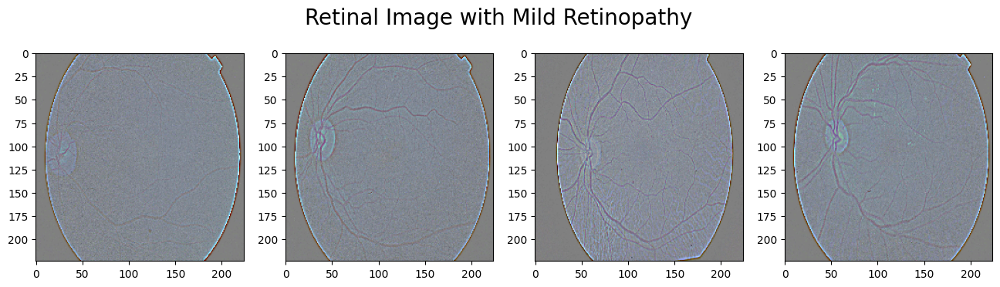

In [7]:
#Viewing the dataset
fig = plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1, 4, i+1)
    img = cv2.imread(path+'/Mild/'+ Mild_Img[i])
    plt.imshow(img)
plt.suptitle("Retinal Image with Mild Retinopathy",fontsize=20)
plt.show()

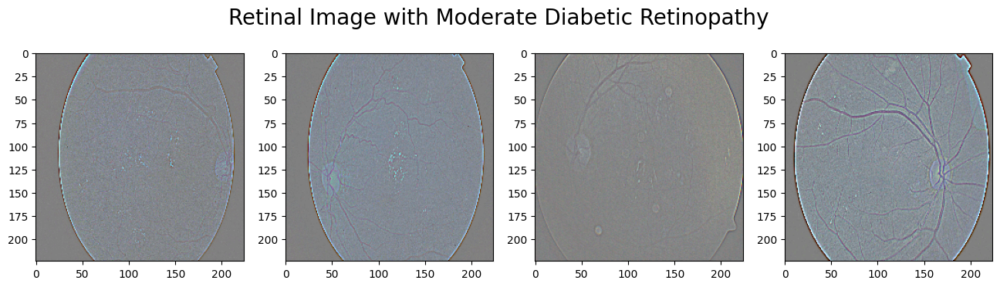

In [8]:
#Viewing the dataset
fig = plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1, 4, i+1)
    img = cv2.imread(path+'/Moderate/'+ Moderate_Img[i])
    plt.imshow(img)
plt.suptitle("Retinal Image with Moderate Diabetic Retinopathy",fontsize=20)
plt.show()

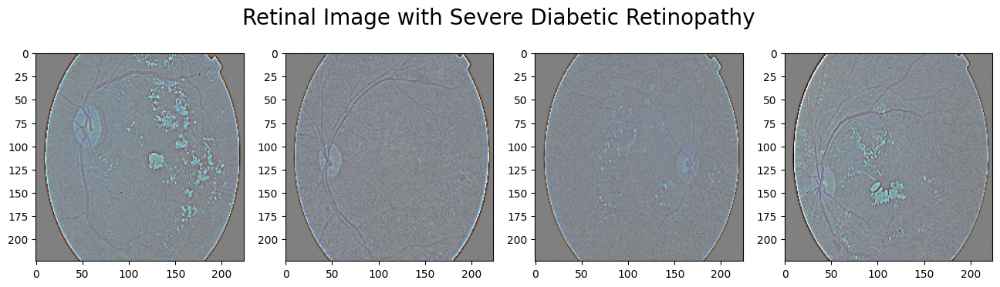

In [9]:
#Viewing the dataset
fig = plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1, 4, i+1)
    img = cv2.imread(path+'/Severe/'+ Severe_Img[i])
    plt.imshow(img)
plt.suptitle("Retinal Image with Severe Diabetic Retinopathy",fontsize=20)
plt.show()

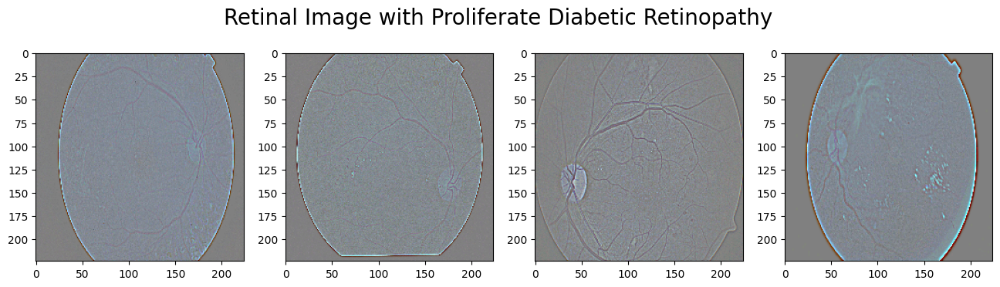

In [10]:
#Viewing the dataset
fig = plt.figure(figsize=(16,4))
for i in range(4):
    plt.subplot(1, 4, i+1)
    img = cv2.imread(path+'/Proliferate_DR/'+ Proliferate_DR_Img[i])
    plt.imshow(img)
plt.suptitle("Retinal Image with Proliferate Diabetic Retinopathy",fontsize=20)
plt.show()

In [11]:
Classes = {'No_DR':0, 'Mild':1, 'Moderate':2, 'Severe':3, 'Proliferate_DR':4}

In [12]:
#Datapreprocessing
gc.collect()

57358

In [13]:
import os
import cv2
import numpy as np

X = []
y = []

desired_size = (128, 128)  

for i in Classes:
    folder_path = os.path.join("C:\\Users\\KIIT\\Downloads\\archive\\gaussian_filtered_images\\gaussian_filtered_images", i)
    
    # Check if the folder exists
    if not os.path.exists(folder_path):
        print(f"Warning: Folder not found - {folder_path}")
        continue  # Skip this class if the folder doesn't exist

    for j in os.listdir(folder_path):
        img_path = os.path.join(folder_path, j)
        img = cv2.imread(img_path)

        if img is None:  # Check if image is loaded successfully
            print(f"Warning: Unable to load image {img_path}")
            continue

        img = cv2.resize(img, desired_size)

        # Normalize pixel values to range 0-1
        img = img / 255.0  

        X.append(img)
        y.append(Classes[i])


In [14]:
X = np.array(X)
y = np.array(y)
X.shape, y.shape

((3662, 128, 128, 3), (3662,))

In [15]:
Class_series=pd.Series(y)
lis=["No_DR","Mild","Moderate","Severe","Proliferate_DR"]
DR_or_not = Class_series.value_counts().tolist()
values = [DR_or_not[0], DR_or_not[1], DR_or_not[2], DR_or_not[3], DR_or_not[4]]
fig = px.pie(values=Class_series.value_counts(), names=lis , width=800, height=400, color_discrete_sequence=["skyblue","black","pink","purple","blue"]
             ,title="percentage among the different Severities of DR")
fig.show()

In [16]:
X[0].shape

(128, 128, 3)

In [17]:
!pip install imbalanced-learn

In [18]:
import sklearn
import imblearn
print("scikit-learn version:", sklearn.__version__)  # Should be >= 1.2
print("imbalanced-learn version:", imblearn.__version__)  # Should be compatible

scikit-learn version: 1.6.1
imbalanced-learn version: 0.13.0


In [19]:
from imblearn.over_sampling import SMOTE
#to avoid class imbalance
#SMOTE to oversample minority class(Edema)
sm = SMOTE(random_state = 2)
X, y = sm.fit_resample(X.reshape(X.shape[0], -1), y.ravel())

In [20]:
Class_series=pd.Series(y)
lis=["No_DR","Mild","Moderate","Severe","Proliferate_DR"]
DR_or_not = Class_series.value_counts().tolist()
values = [DR_or_not[0], DR_or_not[1], DR_or_not[2], DR_or_not[3], DR_or_not[4]]
fig = px.pie(values=Class_series.value_counts(), names=lis , width=800, height=400, color_discrete_sequence=["skyblue","black","pink","purple","blue"]
             ,title="percentage among the different Severities of DR")
fig.show()

In [21]:
X[0].shape

(49152,)

In [22]:
X = X.reshape(X.shape[0], 128, 128, 3)

In [23]:
X[0].shape

(128, 128, 3)

In [24]:
gc.collect()

15221

In [25]:
#Split dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.20, random_state=32, stratify=y)
X_train.shape
X_train.size
X_test.size

88719360

In [26]:
#reshape arr
X_train = X_train.reshape((-1, 128, 128, 3))
X_test = X_test.reshape((-1, 128, 128, 3))

In [27]:
#Import DenseNet121 Architecture
from tensorflow.keras.applications.densenet import DenseNet121
from tensorflow.keras.layers import Dense,Flatten,Input,Dropout,Activation,BatchNormalization,Lambda
model = DenseNet121(input_shape=(128, 128, 3),weights='imagenet',include_top=False)
model.trainable = True

In [28]:
set_trainable = False

for layer in model.layers:
    if layer.name == 'conv5_block16_0_bn':
        set_trainable = True
    if set_trainable:
        layer.trainable = True
    else:
        layer.trainable = False

In [29]:
for layer in model.layers[:]:
    if ('bn' in layer.name):
        trainable = False

In [30]:
x = Flatten()(model.output)
x = tf.keras.layers.Dense(128,activation='relu')(x)
x = tf.keras.layers.Dropout(0.4)(x)
prediction = Dense(5,activation='softmax')(x)

In [31]:
model = Model(inputs=model.input, outputs=prediction)

In [32]:
model.summary()

Model: "functional"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                  ┃ Output Shape              ┃         Param # ┃ Connected to               ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)      │ (None, 128, 128, 3)       │               0 │ -                          │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ zero_padding2d                │ (None, 134, 134, 3)       │               0 │ input_layer[0][0]          │
│ (ZeroPadding2D)               │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_conv (Conv2D)           │ (None, 64, 64, 64)        │           9,408 │ zero_padding2d[0][0]       │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_bn (BatchNormalization) │ (None, 64, 64, 64)        │             256 │ conv1_conv[0][0]           │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv1_relu (Activation)       │ (None, 64, 64, 64)        │               0 │ conv1_bn[0][0]             │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ zero_padding2d_1              │ (None, 66, 66, 64)        │               0 │ conv1_relu[0][0]           │
│ (ZeroPadding2D)               │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ pool1 (MaxPooling2D)          │ (None, 32, 32, 64)        │               0 │ zero_padding2d_1[0][0]     │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_0_bn             │ (None, 32, 32, 64)        │             256 │ pool1[0][0]                │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_0_relu           │ (None, 32, 32, 64)        │               0 │ conv2_block1_0_bn[0][0]    │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_conv (Conv2D)  │ (None, 32, 32, 128)       │           8,192 │ conv2_block1_0_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_bn             │ (None, 32, 32, 128)       │             512 │ conv2_block1_1_conv[0][0]  │
│ (BatchNormalization)          │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_1_relu           │ (None, 32, 32, 128)       │               0 │ conv2_block1_1_bn[0][0]    │
│ (Activation)                  │                           │                 │                            │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_2_conv (Conv2D)  │ (None, 32, 32, 32)        │          36,864 │ conv2_block1_1_relu[0][0]  │
├───────────────────────────────┼───────────────────────────┼─────────────────┼────────────────────────────┤
│ conv2_block1_concat           │ (None, 32, 32, 96)        │               0 │ pool1[0][0],               │
│ (Concatenate)                 │                           │               

 Total params: 9,135,429 (34.85 MB)

 Trainable params: 2,266,053 (8.64 MB)

 Non-trainable params: 6,869,376 (26.20 MB)

                                                                                                  
 conv2_block4_1_bn (BatchNormal  (None, 32, 32, 128)  512        ['conv2_block4_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv2_block4_1_relu (Activatio  (None, 32, 32, 128)  0          ['conv2_block4_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv2_block4_2_conv (Conv2D)   (None, 32, 32, 32)   36864       ['conv2_block4_1_relu[0][0]']    
                                                                                                  
 conv2_block4_concat (Concatena  (None, 32, 32, 192)  0          ['conv2_block3_concat[0][0]',    
 te)      

 conv3_block2_1_conv (Conv2D)   (None, 16, 16, 128)  20480       ['conv3_block2_0_relu[0][0]']    
                                                                                                  
 conv3_block2_1_bn (BatchNormal  (None, 16, 16, 128)  512        ['conv3_block2_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block2_1_relu (Activatio  (None, 16, 16, 128)  0          ['conv3_block2_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv3_block2_2_conv (Conv2D)   (None, 16, 16, 32)   36864       ['conv3_block2_1_relu[0][0]']    
                                                                                                  
 conv3_blo

                                                                                                  
 conv3_block6_2_conv (Conv2D)   (None, 16, 16, 32)   36864       ['conv3_block6_1_relu[0][0]']    
                                                                                                  
 conv3_block6_concat (Concatena  (None, 16, 16, 320)  0          ['conv3_block5_concat[0][0]',    
 te)                                                              'conv3_block6_2_conv[0][0]']    
                                                                                                  
 conv3_block7_0_bn (BatchNormal  (None, 16, 16, 320)  1280       ['conv3_block6_concat[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv3_block7_0_relu (Activatio  (None, 16, 16, 320)  0          ['conv3_block7_0_bn[0][0]']      
 n)       

 lization)                                                                                        
                                                                                                  
 conv3_block11_0_relu (Activati  (None, 16, 16, 448)  0          ['conv3_block11_0_bn[0][0]']     
 on)                                                                                              
                                                                                                  
 conv3_block11_1_conv (Conv2D)  (None, 16, 16, 128)  57344       ['conv3_block11_0_relu[0][0]']   
                                                                                                  
 conv3_block11_1_bn (BatchNorma  (None, 16, 16, 128)  512        ['conv3_block11_1_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 conv3_blo

 conv4_block3_0_bn (BatchNormal  (None, 8, 8, 320)   1280        ['conv4_block2_concat[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block3_0_relu (Activatio  (None, 8, 8, 320)   0           ['conv4_block3_0_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block3_1_conv (Conv2D)   (None, 8, 8, 128)    40960       ['conv4_block3_0_relu[0][0]']    
                                                                                                  
 conv4_block3_1_bn (BatchNormal  (None, 8, 8, 128)   512         ['conv4_block3_1_conv[0][0]']    
 ization)                                                                                         
          

                                                                                                  
 conv4_block7_1_bn (BatchNormal  (None, 8, 8, 128)   512         ['conv4_block7_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv4_block7_1_relu (Activatio  (None, 8, 8, 128)   0           ['conv4_block7_1_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv4_block7_2_conv (Conv2D)   (None, 8, 8, 32)     36864       ['conv4_block7_1_relu[0][0]']    
                                                                                                  
 conv4_block7_concat (Concatena  (None, 8, 8, 480)   0           ['conv4_block6_concat[0][0]',    
 te)      

 conv4_block11_2_conv (Conv2D)  (None, 8, 8, 32)     36864       ['conv4_block11_1_relu[0][0]']   
                                                                                                  
 conv4_block11_concat (Concaten  (None, 8, 8, 608)   0           ['conv4_block10_concat[0][0]',   
 ate)                                                             'conv4_block11_2_conv[0][0]']   
                                                                                                  
 conv4_block12_0_bn (BatchNorma  (None, 8, 8, 608)   2432        ['conv4_block11_concat[0][0]']   
 lization)                                                                                        
                                                                                                  
 conv4_block12_0_relu (Activati  (None, 8, 8, 608)   0           ['conv4_block12_0_bn[0][0]']     
 on)                                                                                              
          

                                                                                                  
 conv4_block16_0_relu (Activati  (None, 8, 8, 736)   0           ['conv4_block16_0_bn[0][0]']     
 on)                                                                                              
                                                                                                  
 conv4_block16_1_conv (Conv2D)  (None, 8, 8, 128)    94208       ['conv4_block16_0_relu[0][0]']   
                                                                                                  
 conv4_block16_1_bn (BatchNorma  (None, 8, 8, 128)   512         ['conv4_block16_1_conv[0][0]']   
 lization)                                                                                        
                                                                                                  
 conv4_block16_1_relu (Activati  (None, 8, 8, 128)   0           ['conv4_block16_1_bn[0][0]']     
 on)      

 lization)                                                                                        
                                                                                                  
 conv4_block20_1_relu (Activati  (None, 8, 8, 128)   0           ['conv4_block20_1_bn[0][0]']     
 on)                                                                                              
                                                                                                  
 conv4_block20_2_conv (Conv2D)  (None, 8, 8, 32)     36864       ['conv4_block20_1_relu[0][0]']   
                                                                                                  
 conv4_block20_concat (Concaten  (None, 8, 8, 896)   0           ['conv4_block19_concat[0][0]',   
 ate)                                                             'conv4_block20_2_conv[0][0]']   
                                                                                                  
 conv4_blo

 conv4_block24_concat (Concaten  (None, 8, 8, 1024)  0           ['conv4_block23_concat[0][0]',   
 ate)                                                             'conv4_block24_2_conv[0][0]']   
                                                                                                  
 pool4_bn (BatchNormalization)  (None, 8, 8, 1024)   4096        ['conv4_block24_concat[0][0]']   
                                                                                                  
 pool4_relu (Activation)        (None, 8, 8, 1024)   0           ['pool4_bn[0][0]']               
                                                                                                  
 pool4_conv (Conv2D)            (None, 8, 8, 512)    524288      ['pool4_relu[0][0]']             
                                                                                                  
 pool4_pool (AveragePooling2D)  (None, 4, 4, 512)    0           ['pool4_conv[0][0]']             
          

                                                                                                  
 conv5_block4_concat (Concatena  (None, 4, 4, 640)   0           ['conv5_block3_concat[0][0]',    
 te)                                                              'conv5_block4_2_conv[0][0]']    
                                                                                                  
 conv5_block5_0_bn (BatchNormal  (None, 4, 4, 640)   2560        ['conv5_block4_concat[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block5_0_relu (Activatio  (None, 4, 4, 640)   0           ['conv5_block5_0_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv5_blo

 conv5_block9_0_relu (Activatio  (None, 4, 4, 768)   0           ['conv5_block9_0_bn[0][0]']      
 n)                                                                                               
                                                                                                  
 conv5_block9_1_conv (Conv2D)   (None, 4, 4, 128)    98304       ['conv5_block9_0_relu[0][0]']    
                                                                                                  
 conv5_block9_1_bn (BatchNormal  (None, 4, 4, 128)   512         ['conv5_block9_1_conv[0][0]']    
 ization)                                                                                         
                                                                                                  
 conv5_block9_1_relu (Activatio  (None, 4, 4, 128)   0           ['conv5_block9_1_bn[0][0]']      
 n)                                                                                               
          

                                                                                                  
 conv5_block13_1_relu (Activati  (None, 4, 4, 128)   0           ['conv5_block13_1_bn[0][0]']     
 on)                                                                                              
                                                                                                  
 conv5_block13_2_conv (Conv2D)  (None, 4, 4, 32)     36864       ['conv5_block13_1_relu[0][0]']   
                                                                                                  
 conv5_block13_concat (Concaten  (None, 4, 4, 928)   0           ['conv5_block12_concat[0][0]',   
 ate)                                                             'conv5_block13_2_conv[0][0]']   
                                                                                                  
 conv5_block14_0_bn (BatchNorma  (None, 4, 4, 928)   3712        ['conv5_block13_concat[0][0]']   
 lization)

In [33]:
gc.collect()

1967

In [34]:
es = EarlyStopping(monitor='val_accuracy', min_delta = 0.005, patience=10, verbose=1, mode='auto')
mc = ModelCheckpoint(monitor='val_accuracy', filepath = 'densenet121_model.h5', verbose=1, save_best_only = True, mode='auto')
cd = [es,mc]

adam = keras.optimizers.Adam(learning_rate=0.0001)
model.compile(loss='sparse_categorical_crossentropy',
              optimizer = adam,
              metrics=['accuracy']
)

In [35]:
gc.collect()

18

In [36]:
model.fit(x=X_train, y=y_train,
          validation_data=(X_test, y_test),
          epochs=45,
          callbacks=cd,
          batch_size=128,
          shuffle=True)


print(model.history.history.keys())

Epoch 1/45
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.4554 - loss: 1.4421
Epoch 1: val_accuracy improved from -inf to 0.61828, saving model to densenet121_model.h5


57/57 ━━━━━━━━━━━━━━━━━━━━ 331s 6s/step - accuracy: 0.4568 - loss: 1.4375 - val_accuracy: 0.6183 - val_loss: 0.9739
Epoch 2/45
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.6513 - loss: 0.8670
Epoch 2: val_accuracy improved from 0.61828 to 0.69086, saving model to densenet121_model.h5


57/57 ━━━━━━━━━━━━━━━━━━━━ 285s 5s/step - accuracy: 0.6515 - loss: 0.8665 - val_accuracy: 0.6909 - val_loss: 0.8062
Epoch 3/45
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.7326 - loss: 0.7122
Epoch 3: val_accuracy improved from 0.69086 to 0.74681, saving model to densenet121_model.h5


57/57 ━━━━━━━━━━━━━━━━━━━━ 254s 4s/step - accuracy: 0.7326 - loss: 0.7120 - val_accuracy: 0.7468 - val_loss: 0.6998
Epoch 4/45
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.7852 - loss: 0.5843
Epoch 4: val_accuracy improved from 0.74681 to 0.79335, saving model to densenet121_model.h5


57/57 ━━━━━━━━━━━━━━━━━━━━ 264s 5s/step - accuracy: 0.7852 - loss: 0.5841 - val_accuracy: 0.7934 - val_loss: 0.5674
Epoch 5/45
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.8215 - loss: 0.4969
Epoch 5: val_accuracy improved from 0.79335 to 0.82271, saving model to densenet121_model.h5


57/57 ━━━━━━━━━━━━━━━━━━━━ 275s 5s/step - accuracy: 0.8216 - loss: 0.4967 - val_accuracy: 0.8227 - val_loss: 0.4934
Epoch 6/45
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8529 - loss: 0.4094
Epoch 6: val_accuracy improved from 0.82271 to 0.84211, saving model to densenet121_model.h5


57/57 ━━━━━━━━━━━━━━━━━━━━ 247s 4s/step - accuracy: 0.8529 - loss: 0.4094 - val_accuracy: 0.8421 - val_loss: 0.4393
Epoch 7/45
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.8741 - loss: 0.3660
Epoch 7: val_accuracy improved from 0.84211 to 0.86260, saving model to densenet121_model.h5


57/57 ━━━━━━━━━━━━━━━━━━━━ 210s 4s/step - accuracy: 0.8742 - loss: 0.3658 - val_accuracy: 0.8626 - val_loss: 0.3981
Epoch 8/45
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 2s/step - accuracy: 0.9055 - loss: 0.2881
Epoch 8: val_accuracy improved from 0.86260 to 0.88698, saving model to densenet121_model.h5


57/57 ━━━━━━━━━━━━━━━━━━━━ 141s 2s/step - accuracy: 0.9055 - loss: 0.2881 - val_accuracy: 0.8870 - val_loss: 0.3540
Epoch 9/45
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9204 - loss: 0.2407
Epoch 9: val_accuracy did not improve from 0.88698
57/57 ━━━━━━━━━━━━━━━━━━━━ 243s 4s/step - accuracy: 0.9205 - loss: 0.2406 - val_accuracy: 0.8837 - val_loss: 0.3545
Epoch 10/45
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9398 - loss: 0.1908
Epoch 10: val_accuracy improved from 0.88698 to 0.90194, saving model to densenet121_model.h5


57/57 ━━━━━━━━━━━━━━━━━━━━ 272s 5s/step - accuracy: 0.9398 - loss: 0.1908 - val_accuracy: 0.9019 - val_loss: 0.2883
Epoch 11/45
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9581 - loss: 0.1587
Epoch 11: val_accuracy improved from 0.90194 to 0.90693, saving model to densenet121_model.h5


57/57 ━━━━━━━━━━━━━━━━━━━━ 249s 4s/step - accuracy: 0.9579 - loss: 0.1589 - val_accuracy: 0.9069 - val_loss: 0.2761
Epoch 12/45
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9590 - loss: 0.1440
Epoch 12: val_accuracy improved from 0.90693 to 0.91136, saving model to densenet121_model.h5


57/57 ━━━━━━━━━━━━━━━━━━━━ 275s 5s/step - accuracy: 0.9589 - loss: 0.1441 - val_accuracy: 0.9114 - val_loss: 0.2604
Epoch 13/45
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9660 - loss: 0.1260
Epoch 13: val_accuracy improved from 0.91136 to 0.92188, saving model to densenet121_model.h5


57/57 ━━━━━━━━━━━━━━━━━━━━ 311s 5s/step - accuracy: 0.9659 - loss: 0.1262 - val_accuracy: 0.9219 - val_loss: 0.2617
Epoch 14/45
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.9694 - loss: 0.1033
Epoch 14: val_accuracy did not improve from 0.92188
57/57 ━━━━━━━━━━━━━━━━━━━━ 348s 6s/step - accuracy: 0.9693 - loss: 0.1034 - val_accuracy: 0.9147 - val_loss: 0.2534
Epoch 15/45
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 5s/step - accuracy: 0.9755 - loss: 0.0945
Epoch 15: val_accuracy did not improve from 0.92188
57/57 ━━━━━━━━━━━━━━━━━━━━ 319s 6s/step - accuracy: 0.9754 - loss: 0.0945 - val_accuracy: 0.9175 - val_loss: 0.2412
Epoch 16/45
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9752 - loss: 0.0838
Epoch 16: val_accuracy did not improve from 0.92188
57/57 ━━━━━━━━━━━━━━━━━━━━ 306s 5s/step - accuracy: 0.9752 - loss: 0.0837 - val_accuracy: 0.9208 - val_loss: 0.2410
Epoch 17/45
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 4s/step - accuracy: 0.9803 - loss: 0.0753
Epoch 17: val_accuracy did not improve from 

57/57 ━━━━━━━━━━━━━━━━━━━━ 281s 5s/step - accuracy: 0.9845 - loss: 0.0554 - val_accuracy: 0.9230 - val_loss: 0.2593
Epoch 21/45
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9850 - loss: 0.0499
Epoch 21: val_accuracy improved from 0.92299 to 0.92964, saving model to densenet121_model.h5


57/57 ━━━━━━━━━━━━━━━━━━━━ 187s 3s/step - accuracy: 0.9850 - loss: 0.0500 - val_accuracy: 0.9296 - val_loss: 0.2382
Epoch 22/45
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9884 - loss: 0.0438
Epoch 22: val_accuracy did not improve from 0.92964
57/57 ━━━━━━━━━━━━━━━━━━━━ 188s 3s/step - accuracy: 0.9884 - loss: 0.0439 - val_accuracy: 0.9252 - val_loss: 0.2561
Epoch 23/45
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9853 - loss: 0.0473
Epoch 23: val_accuracy did not improve from 0.92964
57/57 ━━━━━━━━━━━━━━━━━━━━ 187s 3s/step - accuracy: 0.9853 - loss: 0.0473 - val_accuracy: 0.9247 - val_loss: 0.2470
Epoch 24/45
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9867 - loss: 0.0438
Epoch 24: val_accuracy improved from 0.92964 to 0.93075, saving model to densenet121_model.h5


57/57 ━━━━━━━━━━━━━━━━━━━━ 188s 3s/step - accuracy: 0.9867 - loss: 0.0438 - val_accuracy: 0.9307 - val_loss: 0.2423
Epoch 25/45
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9898 - loss: 0.0416
Epoch 25: val_accuracy did not improve from 0.93075
57/57 ━━━━━━━━━━━━━━━━━━━━ 187s 3s/step - accuracy: 0.9897 - loss: 0.0416 - val_accuracy: 0.9241 - val_loss: 0.2888
Epoch 26/45
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9903 - loss: 0.0375
Epoch 26: val_accuracy did not improve from 0.93075
57/57 ━━━━━━━━━━━━━━━━━━━━ 187s 3s/step - accuracy: 0.9903 - loss: 0.0375 - val_accuracy: 0.9285 - val_loss: 0.2703
Epoch 27/45
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9907 - loss: 0.0359
Epoch 27: val_accuracy did not improve from 0.93075
57/57 ━━━━━━━━━━━━━━━━━━━━ 187s 3s/step - accuracy: 0.9907 - loss: 0.0360 - val_accuracy: 0.9285 - val_loss: 0.2625
Epoch 28/45
57/57 ━━━━━━━━━━━━━━━━━━━━ 0s 3s/step - accuracy: 0.9929 - loss: 0.0281
Epoch 28: val_accuracy did not improve from 

113/113 [==============================] - 371s 3s/step - loss: 0.3273 - accuracy: 0.9010 - val_loss: 0.3900 - val_accuracy: 0.8704
Epoch 27/45
113/113 [==============================] - ETA: 0s - loss: 0.3122 - accuracy: 0.9037
Epoch 27: val_accuracy improved from 0.87147 to 0.87313, saving model to densenet121_model.h5
113/113 [==============================] - 293s 3s/step - loss: 0.3122 - accuracy: 0.9037 - val_loss: 0.3800 - val_accuracy: 0.8731
Epoch 28/45
113/113 [==============================] - ETA: 0s - loss: 0.3029 - accuracy: 0.9087
Epoch 28: val_accuracy improved from 0.87313 to 0.87701, saving model to densenet121_model.h5
113/113 [==============================] - 245s 2s/step - loss: 0.3029 - accuracy: 0.9087 - val_loss: 0.3770 - val_accuracy: 0.8770
Epoch 29/45
113/113 [==============================] - ETA: 0s - loss: 0.2988 - accuracy: 0.9065
Epoch 29: val_accuracy improved from 0.87701 to 0.88255, saving model to densenet121_model.h5
113/113 [======================

In [37]:
history = model.history.history
model_loss=pd.DataFrame(model.history.history)
print(model.history.history.keys())

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])


In [38]:
train_loss = model.history.history['loss']
val_loss = model.history.history['val_loss']
train_acc = model.history.history['accuracy']
val_acc = model.history.history['val_accuracy']

print("Training Accuracy:", round(train_acc[-1], 2))
print("Training Loss:", round(train_loss[-1], 2))
print("Validation Accuracy:", round(val_acc[-1], 2))
print("Validation Loss:", round(val_loss[-1], 2))

Training Accuracy: 0.99
Training Loss: 0.03
Validation Accuracy: 0.93
Validation Loss: 0.28


In [39]:
gc.collect()

806

In [40]:
def plot_metrics(history):
    train_loss = history['loss']
    val_loss = history['val_loss']
    train_acc = history['accuracy']
    val_acc = history['val_accuracy']

    # Loss
    plt.figure()
    plt.plot(train_loss, label='Training Loss')
    plt.plot(val_loss, label='Validation Loss')
    plt.title('Loss')
    plt.legend()
    plt.ylim(0, max(max(train_loss), max(val_loss)))  # Set y-axis limits for loss graph
    plt.show()

    # Accuracy
    plt.figure()
    plt.plot(train_acc, label='Training Accuracy')
    plt.plot(val_acc, label='Validation Accuracy')
    plt.title('Accuracy')
    plt.legend()
    plt.ylim(0, 1)  # Set y-axis limits for accuracy graph
    plt.show()

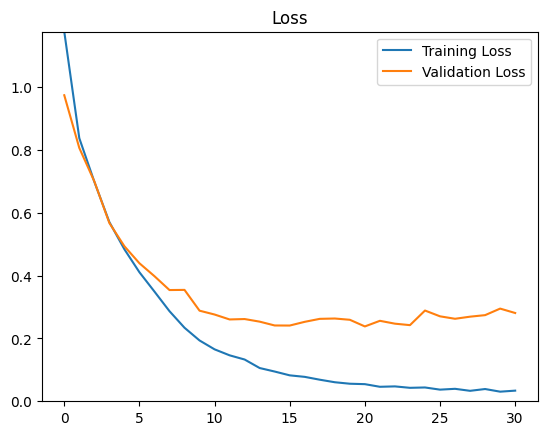

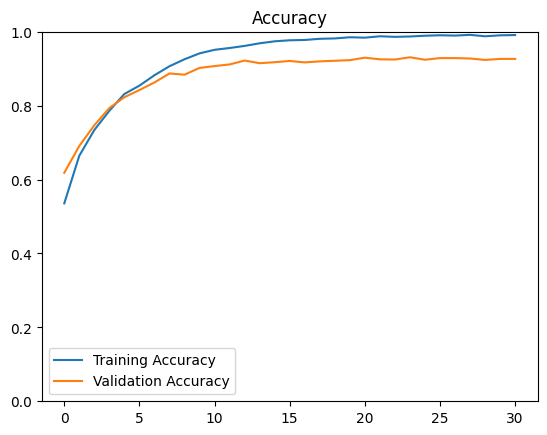

In [41]:
plot_metrics(history)

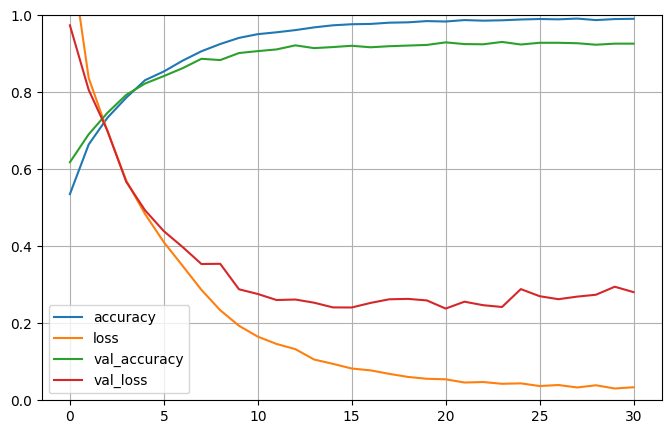

In [42]:
model_loss.plot (figsize = (8,5))
plt.grid(True)
plt.gca().set_ylim(0,1)
plt.show()

In [43]:
model = load_model('densenet121_model.h5')

In [44]:
Model_evaluation = model.evaluate(X_train, y_train)
print(f"%\nAccuracy: {Model_evaluation[1]*100:.4f} %")

226/226 ━━━━━━━━━━━━━━━━━━━━ 285s 1s/step - accuracy: 0.9933 - loss: 0.0194
%
Accuracy: 99.4044 %


In [45]:
y_predicted_tf = model.predict(X_test)
y_predicted_tf

57/57 ━━━━━━━━━━━━━━━━━━━━ 84s 1s/step


array([[1.0000000e+00, 2.5119881e-10, 1.0189434e-08, 2.0496023e-11,
        2.7648390e-09],
       [3.4604189e-05, 9.5713240e-01, 4.2796627e-02, 1.3367110e-05,
        2.2978536e-05],
       [7.4005593e-06, 2.5794120e-06, 1.2314128e-03, 3.6353013e-05,
        9.9872226e-01],
       ...,
       [1.4385865e-03, 9.9855691e-01, 3.8213634e-06, 3.5337774e-07,
        2.7448422e-07],
       [9.9999869e-01, 5.9330077e-08, 1.0916378e-06, 2.6893773e-08,
        1.6574377e-07],
       [1.5797852e-01, 3.5733319e-04, 8.0916280e-01, 2.8694505e-03,
        2.9631848e-02]], dtype=float32)

In [46]:
y_test

array([0, 1, 4, ..., 1, 0, 2])

In [47]:
y_predicted_tf[0]

array([1.0000000e+00, 2.5119881e-10, 1.0189434e-08, 2.0496023e-11,
       2.7648390e-09], dtype=float32)

In [48]:
y_predicted = np.argmax(y_predicted_tf,axis=1)
y_predicted
len(y_predicted)
len(y_test)

1805

In [49]:
df = pd.DataFrame({"Y_test": y_test , "Y_predicted" : y_predicted})
df.head(8)

,Y_test,Y_predicted
0,0,0
1,1,1
2,4,4
3,4,4
4,0,0
5,1,1
6,1,1
7,3,3


In [50]:
Model_evaluation_test = model.evaluate(X_test, y_test)
print(f"%\nTest Accuracy: {Model_evaluation_test[1]*100:.4f} %")

57/57 ━━━━━━━━━━━━━━━━━━━━ 65s 1s/step - accuracy: 0.9373 - loss: 0.2065
%
Test Accuracy: 93.0748 %


In [51]:
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, recall_score, precision_score, f1_score
f1_score(y_test, y_predicted, average='micro')
recall_score(y_test, y_predicted, average='micro')
precision_score(y_test, y_predicted, average='micro')
cm = confusion_matrix(y_test, y_predicted)
print(cm)


[[354   3   3   0   1]
 [  4 347   6   1   3]
 [  7  18 289  18  29]
 [  0   1   4 346  10]
 [  0   4   8   5 344]]


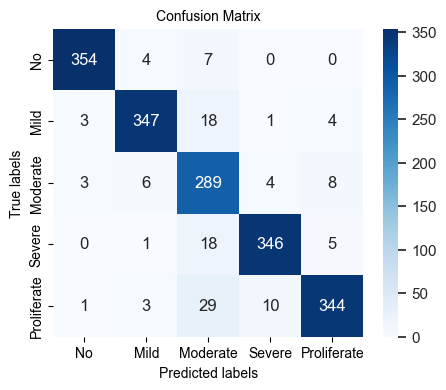

In [52]:
cm = confusion_matrix(y_predicted,y_test)

plt.figure(figsize=(5, 4))
ax = plt.subplot()
sns.set(font_scale=1.0)
sns.heatmap(cm, annot=True, fmt='g', cmap="Blues", ax=ax);

# labels, title and ticks
ax.set_xlabel('Predicted labels', fontsize=10);ax.set_ylabel('True labels', fontsize=10);
ax.set_title('Confusion Matrix', fontsize=10);
ax.xaxis.set_ticklabels(['No','Mild','Moderate','Severe','Proliferate'], fontsize=10); ax.yaxis.set_ticklabels(['No','Mild','Moderate','Severe','Proliferate'], fontsize=10);

In [53]:
import numpy as np
import tensorflow as tf
from tensorflow.keras.preprocessing import image

# Load trained model
model = tf.keras.models.load_model("densenet121_model.h5")

# Define correct class labels (ensure they match your dataset order)
class_labels = ["NoDR", "Mild", "Moderate", "Severe", "ProliferativeDR"]

# Define image path
img_path = "C:\\Users\\KIIT\\Downloads\\archive\\gaussian_filtered_images\\gaussian_filtered_images\\Proliferate_DR\\f850cb51fdba.png"

# Load image & resize to 224x224 (to match model input)
img = image.load_img(img_path, target_size=(128, 128))


# Convert image to array & preprocess
img_array = image.img_to_array(img) / 255.0  # Normalize
img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension

# Predict class
predicted_classes = model.predict(img_array)
predicted_class_index = np.argmax(predicted_classes)

# Get predicted class label
predicted_class_label = class_labels[predicted_class_index]

# Print result
print("Predicted Class Label:", predicted_class_label)


1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step
Predicted Class Label: ProliferativeDR


In [54]:
model.save("densenet121_model.h5")
print("Model downloaded successfully.")

Model downloaded successfully.


In [55]:
import os

dataset_path = r"C:\Users\KIIT\Downloads\archive\gaussian_filtered_images\gaussian_filtered_images"

# List all folders inside the dataset
print("Folders inside dataset path:")
print(os.listdir(dataset_path))  # This will print all folder names


Folders inside dataset path:
['export.pkl', 'Mild', 'Moderate', 'No_DR', 'Proliferate_DR', 'Severe']


In [56]:
['NoDR', 'Mild', 'Moderate', 'Severe', 'Proliferate_DR']

['NoDR', 'Mild', 'Moderate', 'Severe', 'Proliferate_DR']

In [57]:
class_folders = {
    "NoDR": "No_DR",
    "Mild": "Mild",
    "Moderate": "Moderate",
    "Severe": "Severe",
    "ProliferativeDR": "Proliferate_DR",  # <-- Correct this to match your folder name
}

In [58]:
proliferative_path = os.path.join(dataset_path, "Proliferate_DR")  # Adjust based on step 1
if os.path.exists(proliferative_path):
    print("Images inside ProliferativeDR:", os.listdir(proliferative_path))
else:
    print("ProliferativeDR folder does not exist!")

Images inside ProliferativeDR: ['001639a390f0.png', '0083ee8054ee.png', '0243404e8a00.png', '02685f13cefd.png', '02dda30d3acf.png', '0318598cfd16.png', '034cb07a550f.png', '03a7f4a5786f.png', '07122e268a1d.png', '080ee76c958c.png', '080f66eedfb9.png', '08a3875063c3.png', '0981195eb9fb.png', '0ada12c0e78f.png', '0bf37ca3156a.png', '0ceb222f6629.png', '0e0fc1d9810c.png', '0e82bcacc475.png', '10fca1abf338.png', '11242a67122d.png', '15e96e848b46.png', '1638404f385c.png', '165cd2070ebd.png', '16ce555748d8.png', '187f6ccda87a.png', '19ef4d292196.png', '1a7e3356b39c.png', '1a90fad9ffa2.png', '1b32e1d775ea.png', '1bf30c84bbad.png', '1c4f3aa4df06.png', '1e9224ccca95.png', '1efa5d443707.png', '1fd5d860d4d7.png', '2017cd92c63d.png', '20d5fdd450ae.png', '211518c46162.png', '21abd36095a1.png', '21d18b022429.png', '222f3ee3a1e8.png', '22895c89792f.png', '247ac63e5510.png', '247e98aba610.png', '254052cf3e48.png', '25d069089c5e.png', '2628305cbb29.png', '262ad704319c.png', '26463a5fb949.png', '27e2be8

In [59]:
# Importing relevant libraries for showing LIME explanations in image classification
!pip install lime
import pickle
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd
from lime import lime_image
from skimage.segmentation import mark_boundaries
from tensorflow.keras.preprocessing.image import load_img, img_to_array

In [60]:
def predict_fn(images):
    images = np.array(images)  # Normalize images
    return model.predict(images)

In [61]:
import os
import random
dataset_path = r"C:\Users\KIIT\Downloads\archive\gaussian_filtered_images\gaussian_filtered_images"

# Class folders
class_folders = {
    "NoDR": "No_DR",
    "Mild": "Mild",
    "Moderate": "Moderate",
    "Severe": "Severe",
    "ProliferativeDR": "Proliferative_DR",
}

# Function to get a random image from each class
def get_sample_images(dataset_path, class_folders):
    sample_images = {}
    for class_label, folder_name in class_folders.items():
        class_path = os.path.join(dataset_path, folder_name)
        if os.path.exists(class_path):
            images = [img for img in os.listdir(class_path) if img.endswith(".png")]
            if images:
                sample_images[class_label] = os.path.join(class_path, random.choice(images))
    return sample_images

sample_image_paths = get_sample_images(dataset_path, class_folders)
print(sample_image_paths)

{'Mild': 'C:\\Users\\KIIT\\Downloads\\archive\\gaussian_filtered_images\\gaussian_filtered_images\\Mild\\ad1f7445b1a8.png', 'Moderate': 'C:\\Users\\KIIT\\Downloads\\archive\\gaussian_filtered_images\\gaussian_filtered_images\\Moderate\\eb1ad14dd281.png', 'Severe': 'C:\\Users\\KIIT\\Downloads\\archive\\gaussian_filtered_images\\gaussian_filtered_images\\Severe\\31616ff6b53b.png'}


In [62]:
def preprocess_image(image_path):
    """Load and preprocess an image for LIME."""
    img = image.load_img(image_path, target_size=(128, 128))  # Match model input
    original_img = np.array(img)  # Save for visualization
    img_array = image.img_to_array(img) / 255.0  # Normalize
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    return original_img, img_array

Using image: C:\Users\KIIT\Downloads\archive\gaussian_filtered_images\gaussian_filtered_images\Proliferate_DR\d10ef306996b.png
1/1 ━━━━━━━━━━━━━━━━━━━━ 7s 7s/step
Predicted Class: 4


  0%|                                                                                                                             | 0/1000 [00:00<?, ?it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step


  1%|█▏                                                                                                                  | 10/1000 [00:08<13:40,  1.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 471ms/step


  2%|██▎                                                                                                                 | 20/1000 [00:08<06:09,  2.65it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


  3%|███▍                                                                                                                | 30/1000 [00:09<03:43,  4.34it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 459ms/step


  4%|████▋                                                                                                               | 40/1000 [00:10<02:35,  6.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 456ms/step


  5%|█████▊                                                                                                              | 50/1000 [00:10<01:57,  8.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 483ms/step


  6%|██████▉                                                                                                             | 60/1000 [00:11<01:36,  9.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step


  7%|████████                                                                                                            | 70/1000 [00:11<01:21, 11.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 461ms/step


  8%|█████████▎                                                                                                          | 80/1000 [00:12<01:11, 12.85it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 481ms/step


  9%|██████████▍                                                                                                         | 90/1000 [00:12<01:06, 13.79it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 495ms/step


 10%|███████████▌                                                                                                       | 100/1000 [00:13<01:02, 14.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


 11%|████████████▋                                                                                                      | 110/1000 [00:14<00:59, 14.97it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 510ms/step


 12%|█████████████▊                                                                                                     | 120/1000 [00:14<00:57, 15.29it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 497ms/step


 13%|██████████████▉                                                                                                    | 130/1000 [00:15<00:55, 15.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


 14%|████████████████                                                                                                   | 140/1000 [00:16<00:54, 15.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 470ms/step


 15%|█████████████████▎                                                                                                 | 150/1000 [00:16<00:52, 16.20it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 477ms/step


 16%|██████████████████▍                                                                                                | 160/1000 [00:17<00:51, 16.42it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 489ms/step


 17%|███████████████████▌                                                                                               | 170/1000 [00:17<00:50, 16.44it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 460ms/step


 18%|████████████████████▋                                                                                              | 180/1000 [00:18<00:49, 16.63it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 469ms/step


 19%|█████████████████████▊                                                                                             | 190/1000 [00:18<00:48, 16.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 20%|███████████████████████                                                                                            | 200/1000 [00:19<00:48, 16.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


 21%|████████████████████████▏                                                                                          | 210/1000 [00:20<00:47, 16.51it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 427ms/step


 22%|█████████████████████████▎                                                                                         | 220/1000 [00:20<00:45, 17.17it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 23%|██████████████████████████▍                                                                                        | 230/1000 [00:21<00:44, 17.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


 24%|███████████████████████████▌                                                                                       | 240/1000 [00:21<00:45, 16.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


 25%|████████████████████████████▊                                                                                      | 250/1000 [00:22<00:45, 16.46it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


 26%|█████████████████████████████▉                                                                                     | 260/1000 [00:23<00:45, 16.30it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


 27%|███████████████████████████████                                                                                    | 270/1000 [00:23<00:45, 16.16it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 516ms/step


 28%|████████████████████████████████▏                                                                                  | 280/1000 [00:24<00:44, 16.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


 29%|█████████████████████████████████▎                                                                                 | 290/1000 [00:25<00:44, 16.06it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step


 30%|██████████████████████████████████▌                                                                                | 300/1000 [00:25<00:43, 15.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


 31%|███████████████████████████████████▋                                                                               | 310/1000 [00:26<00:43, 15.87it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 520ms/step


 32%|████████████████████████████████████▊                                                                              | 320/1000 [00:27<00:42, 15.84it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


 33%|█████████████████████████████████████▉                                                                             | 330/1000 [00:27<00:42, 15.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


 34%|███████████████████████████████████████                                                                            | 340/1000 [00:28<00:41, 15.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


 35%|████████████████████████████████████████▎                                                                          | 350/1000 [00:28<00:40, 15.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


 36%|█████████████████████████████████████████▍                                                                         | 360/1000 [00:29<00:40, 15.83it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 500ms/step


 37%|██████████████████████████████████████████▌                                                                        | 370/1000 [00:30<00:39, 15.93it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


 38%|███████████████████████████████████████████▋                                                                       | 380/1000 [00:30<00:39, 15.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step


 39%|████████████████████████████████████████████▊                                                                      | 390/1000 [00:31<00:38, 15.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step


 40%|██████████████████████████████████████████████                                                                     | 400/1000 [00:32<00:38, 15.64it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 510ms/step


 41%|███████████████████████████████████████████████▏                                                                   | 410/1000 [00:32<00:37, 15.68it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 597ms/step


 42%|████████████████████████████████████████████████▎                                                                  | 420/1000 [00:33<00:38, 14.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 535ms/step


 43%|█████████████████████████████████████████████████▍                                                                 | 430/1000 [00:34<00:38, 14.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step


 44%|██████████████████████████████████████████████████▌                                                                | 440/1000 [00:34<00:37, 15.03it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


 45%|███████████████████████████████████████████████████▊                                                               | 450/1000 [00:35<00:36, 15.23it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 503ms/step


 46%|████████████████████████████████████████████████████▉                                                              | 460/1000 [00:36<00:34, 15.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


 47%|██████████████████████████████████████████████████████                                                             | 470/1000 [00:36<00:34, 15.58it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 529ms/step


 48%|███████████████████████████████████████████████████████▏                                                           | 480/1000 [00:37<00:33, 15.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


 49%|████████████████████████████████████████████████████████▎                                                          | 490/1000 [00:37<00:32, 15.66it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step


 50%|█████████████████████████████████████████████████████████▌                                                         | 500/1000 [00:38<00:32, 15.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


 51%|██████████████████████████████████████████████████████████▋                                                        | 510/1000 [00:39<00:31, 15.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


 52%|███████████████████████████████████████████████████████████▊                                                       | 520/1000 [00:39<00:30, 15.69it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 501ms/step


 53%|████████████████████████████████████████████████████████████▉                                                      | 530/1000 [00:40<00:29, 15.86it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 510ms/step


 54%|██████████████████████████████████████████████████████████████                                                     | 540/1000 [00:41<00:28, 15.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 468ms/step


 55%|███████████████████████████████████████████████████████████████▎                                                   | 550/1000 [00:41<00:27, 16.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 494ms/step


 56%|████████████████████████████████████████████████████████████████▍                                                  | 560/1000 [00:42<00:26, 16.32it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 524ms/step


 57%|█████████████████████████████████████████████████████████████████▌                                                 | 570/1000 [00:42<00:26, 16.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 527ms/step


 58%|██████████████████████████████████████████████████████████████████▋                                                | 580/1000 [00:43<00:26, 15.70it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


 59%|███████████████████████████████████████████████████████████████████▊                                               | 590/1000 [00:44<00:26, 15.73it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


 60%|█████████████████████████████████████████████████████████████████████                                              | 600/1000 [00:44<00:25, 15.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 560ms/step


 61%|██████████████████████████████████████████████████████████████████████▏                                            | 610/1000 [00:45<00:25, 15.18it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 609ms/step


 62%|███████████████████████████████████████████████████████████████████████▎                                           | 620/1000 [00:46<00:25, 14.72it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 745ms/step


 63%|████████████████████████████████████████████████████████████████████████▍                                          | 630/1000 [00:47<00:27, 13.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 552ms/step


 64%|█████████████████████████████████████████████████████████████████████████▌                                         | 640/1000 [00:47<00:26, 13.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 513ms/step


 65%|██████████████████████████████████████████████████████████████████████████▊                                        | 650/1000 [00:48<00:24, 14.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 523ms/step


 66%|███████████████████████████████████████████████████████████████████████████▉                                       | 660/1000 [00:49<00:23, 14.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


 67%|█████████████████████████████████████████████████████████████████████████████                                      | 670/1000 [00:49<00:22, 14.94it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 682ms/step


 68%|██████████████████████████████████████████████████████████████████████████████▏                                    | 680/1000 [00:50<00:22, 14.05it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 774ms/step


 69%|███████████████████████████████████████████████████████████████████████████████▎                                   | 690/1000 [00:51<00:24, 12.50it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 1s/step   


 70%|████████████████████████████████████████████████████████████████████████████████▌                                  | 700/1000 [00:53<00:28, 10.35it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 667ms/step


 71%|█████████████████████████████████████████████████████████████████████████████████▋                                 | 710/1000 [00:53<00:27, 10.61it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 613ms/step


 72%|██████████████████████████████████████████████████████████████████████████████████▊                                | 720/1000 [00:54<00:24, 11.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 521ms/step


 73%|███████████████████████████████████████████████████████████████████████████████████▉                               | 730/1000 [00:55<00:22, 12.21it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 522ms/step


 74%|█████████████████████████████████████████████████████████████████████████████████████                              | 740/1000 [00:55<00:19, 13.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 500ms/step


 75%|██████████████████████████████████████████████████████████████████████████████████████▎                            | 750/1000 [00:56<00:18, 13.71it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 487ms/step


 76%|███████████████████████████████████████████████████████████████████████████████████████▍                           | 760/1000 [00:57<00:16, 14.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 77%|████████████████████████████████████████████████████████████████████████████████████████▌                          | 770/1000 [00:57<00:15, 14.98it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


 78%|█████████████████████████████████████████████████████████████████████████████████████████▋                         | 780/1000 [00:58<00:14, 15.28it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


 79%|██████████████████████████████████████████████████████████████████████████████████████████▊                        | 790/1000 [00:59<00:13, 15.53it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 533ms/step


 80%|████████████████████████████████████████████████████████████████████████████████████████████                       | 800/1000 [00:59<00:12, 15.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


 81%|█████████████████████████████████████████████████████████████████████████████████████████████▏                     | 810/1000 [01:00<00:13, 14.33it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 507ms/step


 82%|██████████████████████████████████████████████████████████████████████████████████████████████▎                    | 820/1000 [01:01<00:12, 14.80it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 491ms/step


 83%|███████████████████████████████████████████████████████████████████████████████████████████████▍                   | 830/1000 [01:01<00:11, 15.26it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


 84%|████████████████████████████████████████████████████████████████████████████████████████████████▌                  | 840/1000 [01:02<00:10, 15.47it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 517ms/step


 85%|█████████████████████████████████████████████████████████████████████████████████████████████████▊                 | 850/1000 [01:03<00:09, 15.56it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 509ms/step


 86%|██████████████████████████████████████████████████████████████████████████████████████████████████▉                | 860/1000 [01:03<00:09, 15.48it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 515ms/step


 87%|████████████████████████████████████████████████████████████████████████████████████████████████████               | 870/1000 [01:04<00:08, 15.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 480ms/step


 88%|█████████████████████████████████████████████████████████████████████████████████████████████████████▏             | 880/1000 [01:04<00:07, 15.99it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 510ms/step


 89%|██████████████████████████████████████████████████████████████████████████████████████████████████████▎            | 890/1000 [01:05<00:07, 14.62it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 512ms/step


 90%|███████████████████████████████████████████████████████████████████████████████████████████████████████▌           | 900/1000 [01:06<00:06, 15.01it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step


 91%|████████████████████████████████████████████████████████████████████████████████████████████████████████▋          | 910/1000 [01:06<00:05, 15.55it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 498ms/step


 92%|█████████████████████████████████████████████████████████████████████████████████████████████████████████▊         | 920/1000 [01:07<00:05, 15.78it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 502ms/step


 93%|██████████████████████████████████████████████████████████████████████████████████████████████████████████▉        | 930/1000 [01:08<00:04, 15.91it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 505ms/step


 94%|████████████████████████████████████████████████████████████████████████████████████████████████████████████       | 940/1000 [01:08<00:03, 15.96it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 511ms/step


 95%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████▎     | 950/1000 [01:09<00:03, 15.95it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step


 96%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████▍    | 960/1000 [01:10<00:02, 16.27it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 504ms/step


 97%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████▌   | 970/1000 [01:10<00:01, 16.19it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 514ms/step


 98%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋  | 980/1000 [01:11<00:01, 16.08it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 508ms/step


 99%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊ | 990/1000 [01:11<00:00, 16.00it/s]

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 496ms/step


100%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1000/1000 [01:12<00:00, 13.79it/s]


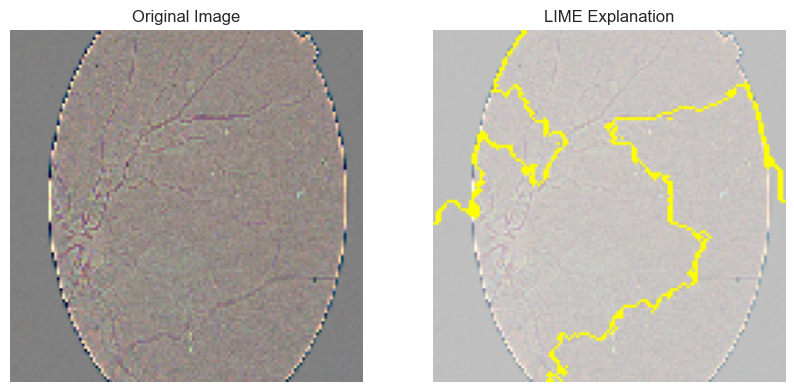

In [63]:
import os
import random
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from lime import lime_image
from skimage.segmentation import mark_boundaries
from tensorflow.keras.preprocessing import image

# Load trained model
model = tf.keras.models.load_model("densenet121_model.h5")

# Define dataset path
dataset_path = r"C:\Users\KIIT\Downloads\archive\gaussian_filtered_images\gaussian_filtered_images"

# Define class folders
class_folders = {
    "NoDR": "NoDR",
    "Mild": "Mild",
    "Moderate": "Moderate",
    "Severe": "Severe",
    "ProliferativeDR": "Proliferate_DR",
}

# Function to get a random image from a class
def get_random_image_path(class_name):
    """Get a random image path from a given class folder."""
    class_path = os.path.join(dataset_path, class_folders[class_name])
    if os.path.exists(class_path):
        images = [img for img in os.listdir(class_path) if img.endswith(".png")]
        if images:
            return os.path.join(class_path, random.choice(images))
    return None

# Pick a random Proliferative DR image
image_path = get_random_image_path("ProliferativeDR")

if image_path is None:
    raise FileNotFoundError("No images found in the ProliferativeDR folder!")

print(f"Using image: {image_path}")

# Preprocess image function
def preprocess_image(image_path):
    """Load and preprocess an image for LIME."""
    img = image.load_img(image_path, target_size=(128, 128))  # Match model input
    original_img = np.array(img)  # Save for visualization
    img_array = image.img_to_array(img) / 255.0  # Normalize
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    return original_img, img_array

# Define predict function for LIME
def predict_fn(images):
    """LIME expects a function that takes a batch of images and returns probabilities."""
    images = np.array(images)  # Ensure it's a NumPy array
    return model.predict(images)

# Generate LIME Explanation
def generate_lime_explanation(image_path, model, predict_fn):
    """Generate and visualize LIME explanation for a given image."""
    
    # Load & preprocess image
    original_img, img_array = preprocess_image(image_path)

    # Get model prediction
    predictions = model.predict(img_array)
    predicted_class = np.argmax(predictions[0])
    print(f"Predicted Class: {predicted_class}")

    # Create LIME explainer instance
    explainer = lime_image.LimeImageExplainer()

    # Generate LIME explanations
    explanation = explainer.explain_instance(
        img_array[0], predict_fn, top_labels=5, hide_color=0, num_samples=1000
    )

    # Visualize explanation
    vis, mask = explanation.get_image_and_mask(
        explanation.top_labels[0], positive_only=True, num_features=5, hide_rest=False
    )

    # Display results
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    ax[0].imshow(original_img)
    ax[0].set_title("Original Image")
    ax[0].axis("off")

    ax[1].imshow(mark_boundaries(vis / 2 + 0.5, mask))
    ax[1].set_title("LIME Explanation")
    ax[1].axis("off")

    plt.show(block=True)  # Fixes display issue in some environments

# Run LIME on the selected image
generate_lime_explanation(image_path, model, predict_fn)
